In [1]:
import pandas as pd
import numpy as np
import tifffile as tf
from astropy.stats import sigma_clipped_stats
from photutils.detection import DAOStarFinder

In [2]:
test_img = tf.imread("/groups/CaiLab/personal/Lex/raw/576_readout_screen/100621_576readout_screen/notebook_pyfiles/pre_processed_images/HybCycle_0/MMStack_Pos0.tif")

In [62]:
def dot_recognition_optimize(data,  threshold):
    ## Input: a matrix object representing an image
    daofind = DAOStarFinder(fwhm=2.0, threshold=threshold, 
                            sigma_radius=2, brightest=None,roundlo=0.5,roundhi=1)
    #print("std: "+ str(std))
    sources = daofind(data)
    if sources == None:
        return None
    for col in sources.colnames:
         sources[col].info.format = '%.8g'  # for consistent table output
    return sources

In [4]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

def plot_2d_locs_on_2d_image(df_locs_2d_1, df_locs_2d_2, img_2d,add_trace = True, zmax=1000):
    
    #For Plotting 2d image
    #-------------------------------------------
    fig = px.imshow(
        img_2d,
        width=700,
        height=700,
        binary_string=True,
        binary_compression_level=4,
        binary_backend='pil',
        zmax = zmax
    )
    #-------------------------------------------
    
    #For Plotting 2d dots
    #-------------------------------------------
    fig.add_trace(go.Scattergl(
        x=df_locs_2d_1.x,
        y=df_locs_2d_1.y,
        mode='markers',
        marker_symbol='cross',
        marker=dict(
            #maxdisplayed=1000,
            size=4
            ),
        name = "Gaussian"
        )
    )
    if add_trace == True:
        fig.add_trace(go.Scattergl(
            x=df_locs_2d_2.x,
            y=df_locs_2d_2.y,
            mode='markers',
            marker_symbol='cross',
            marker=dict(
                #maxdisplayed=1000,
                size=4
                ),
            name = "LoG"
            )
        )
    #-------------------------------------------
    
    fig.show()
    
def plot_3d_locs_on_2d_image(df_tiff_1, df_tiff_2, tiff, channel, 
                             raw_src = None, raw_image = False,
                             add_trace = True,swap_axes=True, zmax=10):
    
    if raw_image == False:
        if len(tiff.shape) == 3:
            if add_trace == False:
                plot_2d_locs_on_2d_image(df_tiff_1, None, tiff[channel], zmax=zmax, add_trace=add_trace)
            else:
                plot_2d_locs_on_2d_image(df_tiff_1, df_tiff_2, tiff[channel],add_trace=add_trace, zmax=zmax)
        else:
        #PLot All Z's that had dot detection
        #-------------------------------------------
            for z in range(len(tiff[:,channel])):
                if add_trace == False:
                    df_locs_2d_1 = df_tiff_1[(df_tiff_1.z > z-1) & (df_tiff_1.z < z+1)]
                    plot_2d_locs_on_2d_image(df_locs_2d_1, None, tiff[z, channel], zmax=zmax, add_trace=add_trace)
                else:
                    df_locs_2d_1 = df_tiff_1[(df_tiff_1.z > z-1) & (df_tiff_1.z < z+1)]
                    df_locs_2d_2= df_tiff_2[(df_tiff_2.z > z-1) & (df_tiff_2.z < z+1)]
                    plot_2d_locs_on_2d_image(df_locs_2d_1,df_locs_2d_2, tiff[z, channel],add_trace=add_trace, zmax=zmax)
    else:
        #read raw image
        tiff = tf.imread(raw_src)
        if swap_axes==True:
            tiff = np.swapaxes(tiff,0,1)
        print("shape =", tiff.shape)
        #plot
        if len(tiff.shape)==3:
            if add_trace == False:
                plot_2d_locs_on_2d_image(df_tiff_1, None, tiff[channel], zmax=zmax, add_trace=add_trace)
            else:
                plot_2d_locs_on_2d_image(df_tiff_1, df_tiff_2, tiff[channel],add_trace=add_trace, zmax=zmax)
        else:
            for z in range(len(tiff[:,channel])):
                if add_trace == False:
                    df_locs_2d_1 = df_tiff_1[(df_tiff_1.z > z-1) & (df_tiff_1.z < z+1)]
                    plot_2d_locs_on_2d_image(df_locs_2d_1,None, tiff[z, channel], zmax=zmax, add_trace=add_trace)
                else:
                    df_locs_2d_1 = df_tiff_1[(df_tiff_1.z > z-1) & (df_tiff_1.z < z+1)]
                    df_locs_2d_2= df_tiff_2[(df_tiff_2.z > z-1) & (df_tiff_2.z < z+1)]
                    plot_2d_locs_on_2d_image(df_locs_2d_1,df_locs_2d_2, tiff[z, channel],add_trace=add_trace, zmax=zmax)

In [58]:
table = dot_recognition_optimize(test_img[0][0],  threshold=300)
dot_info = table["xcentroid","ycentroid", "peak", "npix"].to_pandas()
dot_info.columns = ["x","y","intensity","area"]
dot_info["z"] = 0

/home/kcolon/miniconda3/lib/python3.8/site-packages/astropy/table/table.py:3197: FutureWarning:

elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.



In [59]:
dot_info

,x,y,intensity,area,z
0,1501.189965,0.510083,1704.0,25,0
1,459.627895,7.877899,1409.0,25,0
2,770.428829,21.123094,1398.0,25,0
3,584.324889,42.416922,1157.0,25,0
4,1720.495826,43.813678,696.0,25,0
...,...,...,...,...,...
558,920.563848,2029.368327,2995.0,25,0
559,958.394710,2029.746679,509.0,25,0
560,463.928395,2044.187829,517.0,25,0
561,170.318946,2046.276499,1217.0,25,0


shape = (2, 5, 2048, 2048)



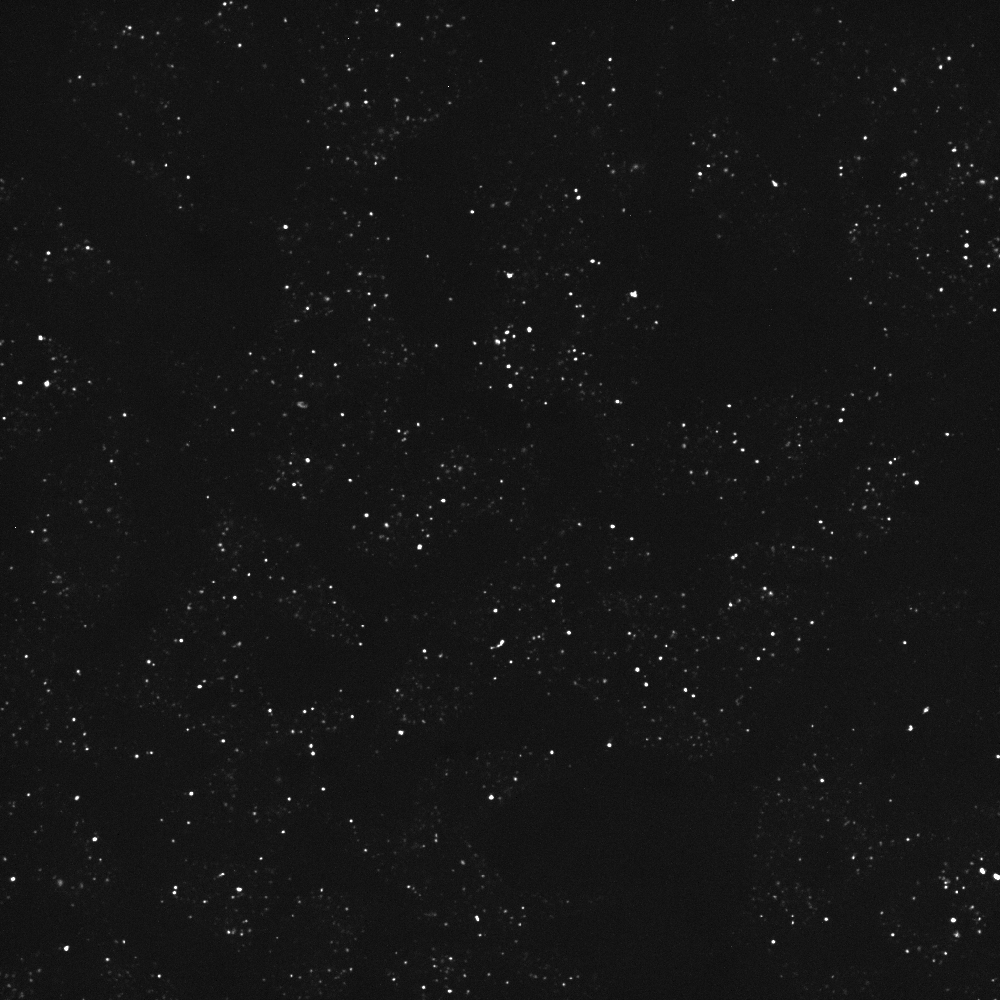


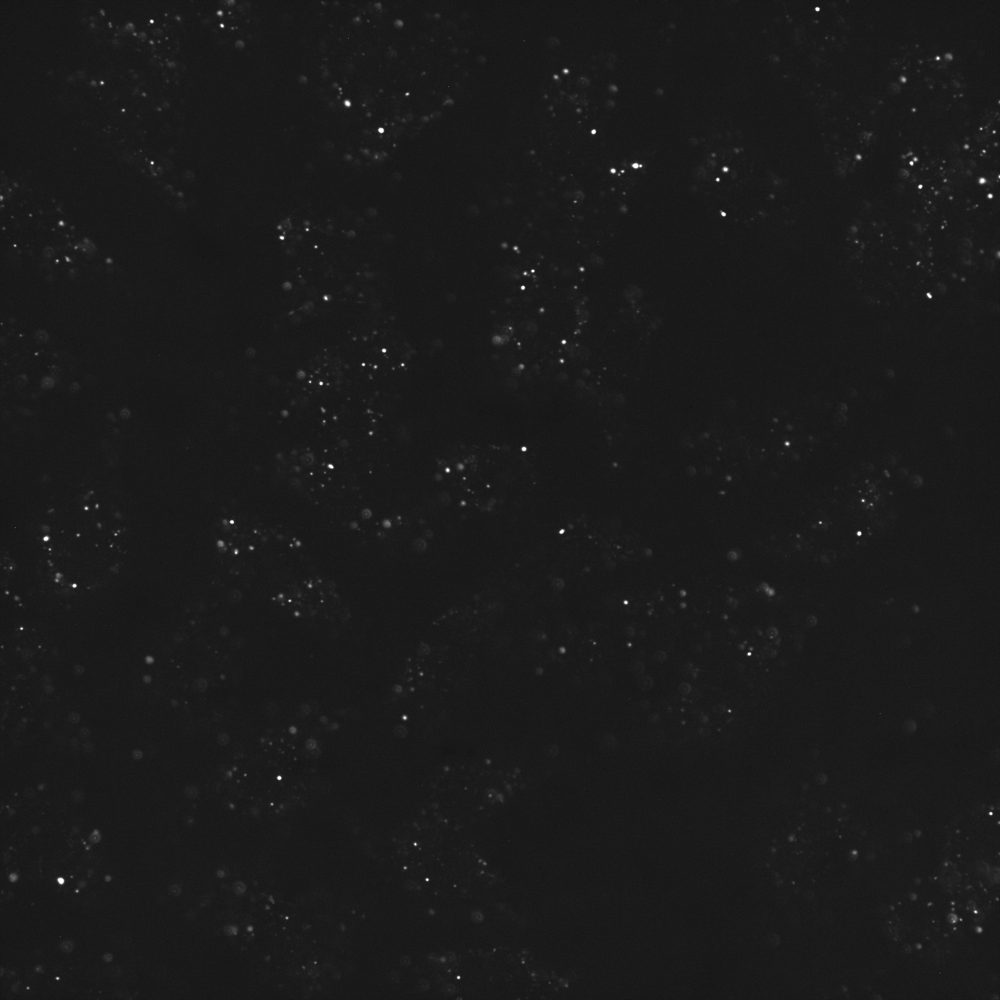

In [63]:
hyb = 0
pos = 0
img_raw = f'/groups/CaiLab/personal/Lex/raw/576_readout_screen/100621_576readout_screen/notebook_pyfiles/dapi_aligned/HybCycle_{hyb}/MMStack_Pos{pos}.ome.tif'
plot_3d_locs_on_2d_image(dot_info,None, tiff=None, channel=0, raw_src = img_raw, 
                         raw_image = True, add_trace=False, zmax=1000)